# A Performing Data Pre-processing/Data Cleaning

In [8]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [9]:
import os

In [34]:
os.listdir(r"C:\Users\USER\Desktop\Projects\Data Science Projects\2023 data analysis\Uber\Datasets")

['other-American_B01362.csv',
 'other-Carmel_B00256.csv',
 'other-Dial7_B00887.csv',
 'other-Diplo_B01196.csv',
 'other-Federal_02216.csv',
 'other-FHV-services_jan-aug-2015.csv',
 'other-Firstclass_B01536.csv',
 'other-Highclass_B01717.csv',
 'other-Lyft_B02510.csv',
 'other-Prestige_B01338.csv',
 'other-Skyline_B00111.csv',
 'Uber-Jan-Feb-FOIL.csv',
 'uber-raw-data-apr14.csv',
 'uber-raw-data-aug14.csv',
 'uber-raw-data-janjune-15.csv',
 'uber-raw-data-janjune-15_sample.csv',
 'uber-raw-data-jul14.csv',
 'uber-raw-data-jun14.csv',
 'uber-raw-data-may14.csv',
 'uber-raw-data-sep14.csv']

In [35]:
uber_15 = pd.read_csv(r"C:\Users\USER\Desktop\Projects\Data Science Projects\2023 data analysis\Uber\Datasets/uber-raw-data-janjune-15_sample.csv")

In [36]:
uber_15.shape

(100000, 4)

In [37]:
type(uber_15)

pandas.core.frame.DataFrame

pandas.core.frame.DataFrame   is saying is an object of dataframe class

In [38]:
uber_15.duplicated()   #this is to check if there are duplicates 
#if duplicates are present it will say true   #it is a boolean value

0        False
1        False
2        False
3        False
4        False
         ...  
99995    False
99996    False
99997    False
99998    False
99999    False
Length: 100000, dtype: bool

In [39]:
uber_15.duplicated().sum()    #to sum the duplicate values

54

in order to drop the duplicate values

In [40]:
uber_15.drop_duplicates(inplace=True)

In [41]:
# so to see if the duplicates are dropped we run the code again
# we now have zero duplicate

uber_15.duplicated().sum()

0

In [42]:
# so we have (99946, 4) as against our previous value
uber_15.shape

(99946, 4)

In [43]:
uber_15.dtypes    #we have object which are all integal

Dispatching_base_num    object
Pickup_date             object
Affiliated_base_num     object
locationID               int64
dtype: object

In [44]:
# to check the missing values   
# uber_15.isnull() will return a boolean dataframe
uber_15.isnull()

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID
0,False,False,False,False
1,False,False,False,False
2,False,False,False,False
3,False,False,False,False
4,False,False,False,False
...,...,...,...,...
99995,False,False,False,False
99996,False,False,False,False
99997,False,False,False,False
99998,False,False,False,False


In [45]:
# here only Affiliated_base_num   has a missing value of 1116
uber_15.isnull().sum()

Dispatching_base_num       0
Pickup_date                0
Affiliated_base_num     1116
locationID                 0
dtype: int64

In [46]:
uber_15['Pickup_date']

0        2015-05-02 21:43:00
1        2015-01-20 19:52:59
2        2015-03-19 20:26:00
3        2015-04-10 17:38:00
4        2015-03-23 07:03:00
                ...         
99995    2015-04-13 16:12:00
99996    2015-03-06 21:32:00
99997    2015-03-19 19:56:00
99998    2015-05-02 16:02:00
99999    2015-06-24 16:04:00
Name: Pickup_date, Length: 99946, dtype: object

In [47]:
uber_15['Pickup_date'][0]

'2015-05-02 21:43:00'

In [48]:
type(uber_15['Pickup_date'][0])

str

so to convert this to datetime we use the function

In [49]:
uber_15['Pickup_date'] = pd.to_datetime(uber_15['Pickup_date'])

In [50]:
uber_15['Pickup_date'].dtype

dtype('<M8[ns]')

In [51]:
uber_15['Pickup_date'][0]

Timestamp('2015-05-02 21:43:00')

In [52]:
type(uber_15['Pickup_date'][0])

pandas._libs.tslibs.timestamps.Timestamp

now the datatype shows that it now belong to a datatype called 'Timestamp' datetime64[ns] is a general datatypess for timestamp

In [53]:
uber_15.dtypes

Dispatching_base_num            object
Pickup_date             datetime64[ns]
Affiliated_base_num             object
locationID                       int64
dtype: object

# Which month have max. Uber pickups in New York City ?

In [54]:
# uber_15 = uber_15['Pickup_date'].dt.month_name()
uber_15['month'] = uber_15['Pickup_date'].dt.month_name()

In [55]:
uber_15['month']

0            May
1        January
2          March
3          April
4          March
          ...   
99995      April
99996      March
99997      March
99998        May
99999       June
Name: month, Length: 99946, dtype: object

<AxesSubplot:>

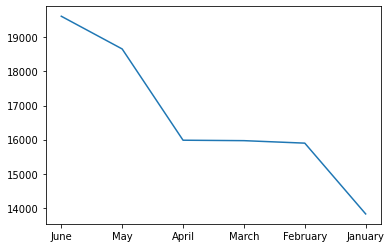

In [56]:
uber_15['month'].value_counts().plot()

<AxesSubplot:>

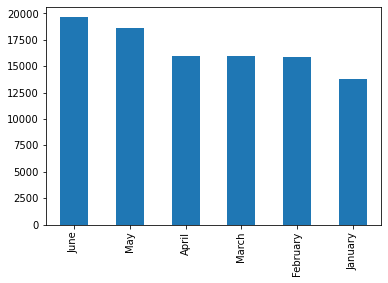

In [60]:
uber_15['month'].value_counts().plot(kind='bar')

<AxesSubplot:ylabel='month'>

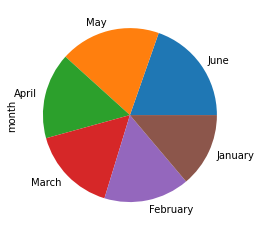

In [61]:
uber_15['month'].value_counts().plot(kind='pie')

it shows that 'June' has the higest values of pick-up 

to have a pivot view

In [64]:
uber_15['weekday'] = uber_15['Pickup_date'].dt.day_name()
uber_15['day'] = uber_15['Pickup_date'].dt.day
uber_15['hour'] = uber_15['Pickup_date'].dt.hour
uber_15['minute'] = uber_15['Pickup_date'].dt.minute

In [65]:
uber_15.head(4)

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID,month,weekday,day,hour,minute
0,B02617,2015-05-02 21:43:00,B02764,237,May,Saturday,2,21,43
1,B02682,2015-01-20 19:52:59,B02682,231,January,Tuesday,20,19,52
2,B02617,2015-03-19 20:26:00,B02617,161,March,Thursday,19,20,26
3,B02764,2015-04-10 17:38:00,B02764,107,April,Friday,10,17,38


In [69]:
pivot = pd.crosstab(index=uber_15['month'], columns=uber_15['weekday'])

<AxesSubplot:xlabel='month'>

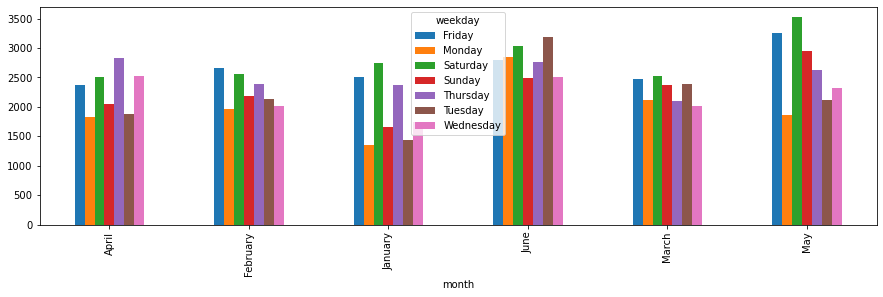

In [88]:
pivot.plot(kind='bar', figsize=(15,4))

# Analysing Hour Rush In New Your

In [97]:
summary = uber_15.groupby(['weekday', 'hour'], as_index=False).size()

In [98]:
summary

,weekday,hour,size
0,Friday,0,581
1,Friday,1,333
2,Friday,2,197
3,Friday,3,138
4,Friday,4,161
...,...,...,...
163,Wednesday,19,1044
164,Wednesday,20,897
165,Wednesday,21,949
166,Wednesday,22,900


<AxesSubplot:xlabel='hour', ylabel='size'>

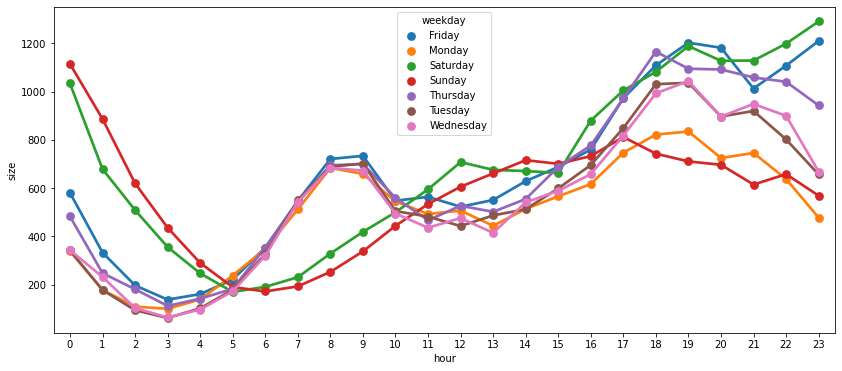

In [101]:
plt.figure(figsize=(14,6))
sns.pointplot(x='hour', y='size', hue='weekday', data=summary)

conclusion:
    It's interesting to see that Saturday and Sunday exhibit similar demand throughout the late night/morning/afternoon, 
    but it exhibits opposite trends during the evening. In the evening, Saturday pickups continue to increase throughout the   evening,
    but Sunday pickups takes a downward turn after evening..

    We can see that there the weekdays that has the most demand during the late evening is Friday and Saturday, 
    which is expected, but what strikes me is that Thursday nights also exhibits very similar trends as Friday and Saturday nights.

    It seems like New Yorkers are starting their 'weekends' on Thursday nights. :)

# Which Base_number has most number of Active Vehicles ??

In [103]:
uber_15.columns

Index(['Dispatching_base_num', 'Pickup_date', 'Affiliated_base_num',
       'locationID', 'month', 'weekday', 'day', 'hour', 'minute'],
      dtype='object')

In [108]:
os.listdir(r"C:\Users\USER\Desktop\Projects\Data Science Projects\2023 data analysis\Uber\Datasets")

['other-American_B01362.csv',
 'other-Carmel_B00256.csv',
 'other-Dial7_B00887.csv',
 'other-Diplo_B01196.csv',
 'other-Federal_02216.csv',
 'other-FHV-services_jan-aug-2015.csv',
 'other-Firstclass_B01536.csv',
 'other-Highclass_B01717.csv',
 'other-Lyft_B02510.csv',
 'other-Prestige_B01338.csv',
 'other-Skyline_B00111.csv',
 'Uber-Jan-Feb-FOIL.csv',
 'uber-raw-data-apr14.csv',
 'uber-raw-data-aug14.csv',
 'uber-raw-data-janjune-15.csv',
 'uber-raw-data-janjune-15_sample.csv',
 'uber-raw-data-jul14.csv',
 'uber-raw-data-jun14.csv',
 'uber-raw-data-may14.csv',
 'uber-raw-data-sep14.csv']

In [112]:
uber_foil = pd.read_csv(r"C:\Users\USER\Desktop\Projects\Data Science Projects\2023 data analysis\Uber\Datasets/Uber-Jan-Feb-FOIL.csv")

In [125]:
uber_foil.shape

(354, 4)

In [117]:
uber_foil.head()

,dispatching_base_number,date,active_vehicles,trips
0,B02512,1/1/2015,190,1132
1,B02765,1/1/2015,225,1765
2,B02764,1/1/2015,3427,29421
3,B02682,1/1/2015,945,7679
4,B02617,1/1/2015,1228,9537


In [120]:
uber_foil.describe()

,active_vehicles,trips
count,354.000000,354.000000
mean,1307.435028,11667.316384
std,1162.510626,10648.284865
min,112.000000,629.000000
25%,296.750000,2408.500000
50%,1077.000000,9601.000000
75%,1417.000000,13711.250000
max,4395.000000,45858.000000


In [135]:
import chart_studio.plotly as py
import plotly.graph_objects as go
import plotly.express as px 

from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

In [136]:
init_notebook_mode(connected=True)

In [137]:
uber_foil.columns

Index(['dispatching_base_number', 'date', 'active_vehicles', 'trips'], dtype='object')

In [134]:
px.box(x='dispatching_base_number', y='active_vehicles', data_frame=uber_foil)

In [138]:
px.violin(x='dispatching_base_number', y='active_vehicles', data_frame=uber_foil)

conclusion:
    we can see the percentage of the of the active vehicle and their dispatching_base_number in accordance to their distribution.
    max means maximum time of use
    q3 means 75%, 
    meduim value
    q1 means 25%

In [223]:
files = os.listdir(r"C:\Users\USER\Desktop\Projects\Data Science Projects\2023 data analysis\Uber\Datasets")[-8:]

In [224]:
files

['uber-raw-data-apr14.csv',
 'uber-raw-data-aug14.csv',
 'uber-raw-data-janjune-15.csv',
 'uber-raw-data-janjune-15_sample.csv',
 'uber-raw-data-jul14.csv',
 'uber-raw-data-jun14.csv',
 'uber-raw-data-may14.csv',
 'uber-raw-data-sep14.csv']

In [225]:
files.remove('uber-raw-data-janjune-15_sample.csv')

In [226]:
files

['uber-raw-data-apr14.csv',
 'uber-raw-data-aug14.csv',
 'uber-raw-data-janjune-15.csv',
 'uber-raw-data-jul14.csv',
 'uber-raw-data-jun14.csv',
 'uber-raw-data-may14.csv',
 'uber-raw-data-sep14.csv']

In [227]:
files.remove('uber-raw-data-janjune-15.csv')

In [228]:
files

['uber-raw-data-apr14.csv',
 'uber-raw-data-aug14.csv',
 'uber-raw-data-jul14.csv',
 'uber-raw-data-jun14.csv',
 'uber-raw-data-may14.csv',
 'uber-raw-data-sep14.csv']

In [229]:
len(files)  #so we have 6 csv files

6

so we add the files together
we concate all

In [230]:
final = pd.DataFrame()

path = r"C:\Users\USER\Desktop\Projects\Data Science Projects\2023 data analysis\Uber\Datasets"

for file in files:
    current_df = pd.read_csv(path + '/' + file)
    final = pd.concat([current_df, final])

In [231]:
final.shape

(4534327, 4)

In [232]:
final.duplicated().sum()

82581

In [233]:
final.drop_duplicates(inplace=True)

In [234]:
final.shape

(4451746, 4)

In [235]:
final.head(3)

,Date/Time,Lat,Lon,Base
0,9/1/2014 0:01:00,40.2201,-74.0021,B02512
1,9/1/2014 0:01:00,40.7500,-74.0027,B02512
2,9/1/2014 0:03:00,40.7559,-73.9864,B02512


Dataset Information :
The dataset contains information about the Datetime, Latitude, Longitude and Base of each uber ride that happened in the month of July 2014 at New York City, USA
Date/Time : The date and time of the Uber pickup
Lat : The latitude of the Uber pickup
Lon : The longitude of the Uber pickup
Base : The TLC base company code affiliated with the Uber pickup

The Base codes are for the following Uber bases:
B02512 : Unter
B02598 : Hinter
B02617 : Weiter
B02682 : Schmecken
B02764 : Danach-NY

# what locations of New York City we are getting rush ??

In [173]:
rush_uber = final.groupby(['Lat', 'Lon'], as_index=False).size()

In [175]:
rush_uber.head(6)

,Lat,Lon,size
0,39.6569,-74.2258,1
1,39.6686,-74.1607,1
2,39.7214,-74.2446,1
3,39.8416,-74.1512,1
4,39.9055,-74.0791,1
5,39.9196,-74.1112,1


In [177]:
import folium

In [178]:
basemap = folium.Map()

In [179]:
basemap

In [180]:
from folium.plugins import HeatMap

In [181]:
HeatMap(rush_uber).add_to(basemap)

In [182]:
basemap

We can see a number of hot spots here. Midtown Manhattan is clearly a huge bright spot
& these are made from Midtown to Lower Manhattan followed by Upper Manhattan and the Heights of Brooklyn.

# Examine rush on Hour and Weekday ( Perform Pair wise Analysis )

In [236]:
final.columns

Index(['Date/Time', 'Lat', 'Lon', 'Base'], dtype='object')

In [237]:
final.head(3)

,Date/Time,Lat,Lon,Base
0,9/1/2014 0:01:00,40.2201,-74.0021,B02512
1,9/1/2014 0:01:00,40.7500,-74.0027,B02512
2,9/1/2014 0:03:00,40.7559,-73.9864,B02512


In [238]:
final.dtypes

Date/Time     object
Lat          float64
Lon          float64
Base          object
dtype: object

In [239]:
final['Date/Time'][0]

0    9/1/2014 0:01:00
0    5/1/2014 0:02:00
0    6/1/2014 0:00:00
0    7/1/2014 0:03:00
0    8/1/2014 0:03:00
0    4/1/2014 0:11:00
Name: Date/Time, dtype: object

In [240]:
### converting 'Date/Time' feature into date-time..

final['Date/Time'] = pd.to_datetime(final['Date/Time'] , format="%m/%d/%Y %H:%M:%S")

In [241]:
final['Date/Time'].dtype

dtype('<M8[ns]')

In [243]:
### extracting 'weekday' & 'hour' from 'Date/Time' feature..

final['day'] = final['Date/Time'].dt.day
final['hour'] = final['Date/Time'].dt.hour

In [244]:
final.head(4)

,Date/Time,Lat,Lon,Base,day,hour
0,2014-09-01 00:01:00,40.2201,-74.0021,B02512,1,0
1,2014-09-01 00:01:00,40.7500,-74.0027,B02512,1,0
2,2014-09-01 00:03:00,40.7559,-73.9864,B02512,1,0
3,2014-09-01 00:06:00,40.7450,-73.9889,B02512,1,0


In [245]:
pivot = final.groupby(['day' , 'hour']).size().unstack()

In [246]:
pivot

### pivot table is all about  , we have Rows*columns & having value in each cell !

hour,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
day,,,,,,,,,,,,,,,,,,,,,
1,3178,1944,1256,1308,1429,2126,3664,5380,5292,4617,...,6933,7910,8633,9511,8604,8001,7315,7803,6268,4050
2,2435,1569,1087,1414,1876,2812,4920,6544,6310,4712,...,6904,8449,10109,11100,11123,9474,8759,8357,6998,5160
3,3354,2142,1407,1467,1550,2387,4241,5663,5386,4657,...,7226,8850,10314,10491,11239,9599,9026,8531,7142,4686
4,2897,1688,1199,1424,1696,2581,4592,6029,5704,4744,...,7158,8515,9492,10357,10259,9097,8358,8649,7706,5130
5,2733,1541,1030,1253,1617,2900,4814,6261,6469,5530,...,6955,8312,9609,10699,10170,9430,9354,9610,8853,6518
6,4537,2864,1864,1555,1551,2162,3642,4766,4942,4401,...,7235,8612,9444,9929,9263,8405,8117,8567,7852,5946
7,3645,2296,1507,1597,1763,2422,4102,5575,5376,4639,...,7276,8474,10393,11013,10573,9472,8691,8525,7194,4801
8,2830,1646,1123,1483,1889,3224,5431,7361,7357,5703,...,7240,8775,9851,10673,9687,8796,8604,8367,6795,4256
9,2657,1724,1222,1480,1871,3168,5802,7592,7519,5895,...,7877,9220,10270,11910,11449,9804,8909,8665,7499,5203


In [247]:
### styling dataframe

pivot.style.background_gradient()

hour,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23
day,,,,,,,,,,,,,,,,,,,,,,,,
1,3178,1944,1256,1308,1429,2126,3664,5380,5292,4617,4607,4729,4930,5794,6933,7910,8633,9511,8604,8001,7315,7803,6268,4050
2,2435,1569,1087,1414,1876,2812,4920,6544,6310,4712,4797,4975,5188,5695,6904,8449,10109,11100,11123,9474,8759,8357,6998,5160
3,3354,2142,1407,1467,1550,2387,4241,5663,5386,4657,4788,5065,5384,6093,7226,8850,10314,10491,11239,9599,9026,8531,7142,4686
4,2897,1688,1199,1424,1696,2581,4592,6029,5704,4744,4743,4975,5193,6175,7158,8515,9492,10357,10259,9097,8358,8649,7706,5130
5,2733,1541,1030,1253,1617,2900,4814,6261,6469,5530,5141,5011,5047,5690,6955,8312,9609,10699,10170,9430,9354,9610,8853,6518
6,4537,2864,1864,1555,1551,2162,3642,4766,4942,4401,4801,5174,5426,6258,7235,8612,9444,9929,9263,8405,8117,8567,7852,5946
7,3645,2296,1507,1597,1763,2422,4102,5575,5376,4639,4905,5166,5364,6214,7276,8474,10393,11013,10573,9472,8691,8525,7194,4801
8,2830,1646,1123,1483,1889,3224,5431,7361,7357,5703,5288,5350,5483,6318,7240,8775,9851,10673,9687,8796,8604,8367,6795,4256
9,2657,1724,1222,1480,1871,3168,5802,7592,7519,5895,5406,5443,5496,6419,7877,9220,10270,11910,11449,9804,8909,8665,7499,5203


# How to Automate Your Analysis..?¶

In [248]:
## creating a user-defined function..

def gen_pivot_table(df , col1 , col2):
    pivot = final.groupby([col1 , col2]).size().unstack()
    return pivot.style.background_gradient()

In [249]:
final.columns

Index(['Date/Time', 'Lat', 'Lon', 'Base', 'day', 'hour'], dtype='object')

In [250]:
gen_pivot_table(final , "day" , "hour")

hour,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23
day,,,,,,,,,,,,,,,,,,,,,,,,
1,3178,1944,1256,1308,1429,2126,3664,5380,5292,4617,4607,4729,4930,5794,6933,7910,8633,9511,8604,8001,7315,7803,6268,4050
2,2435,1569,1087,1414,1876,2812,4920,6544,6310,4712,4797,4975,5188,5695,6904,8449,10109,11100,11123,9474,8759,8357,6998,5160
3,3354,2142,1407,1467,1550,2387,4241,5663,5386,4657,4788,5065,5384,6093,7226,8850,10314,10491,11239,9599,9026,8531,7142,4686
4,2897,1688,1199,1424,1696,2581,4592,6029,5704,4744,4743,4975,5193,6175,7158,8515,9492,10357,10259,9097,8358,8649,7706,5130
5,2733,1541,1030,1253,1617,2900,4814,6261,6469,5530,5141,5011,5047,5690,6955,8312,9609,10699,10170,9430,9354,9610,8853,6518
6,4537,2864,1864,1555,1551,2162,3642,4766,4942,4401,4801,5174,5426,6258,7235,8612,9444,9929,9263,8405,8117,8567,7852,5946
7,3645,2296,1507,1597,1763,2422,4102,5575,5376,4639,4905,5166,5364,6214,7276,8474,10393,11013,10573,9472,8691,8525,7194,4801
8,2830,1646,1123,1483,1889,3224,5431,7361,7357,5703,5288,5350,5483,6318,7240,8775,9851,10673,9687,8796,8604,8367,6795,4256
9,2657,1724,1222,1480,1871,3168,5802,7592,7519,5895,5406,5443,5496,6419,7877,9220,10270,11910,11449,9804,8909,8665,7499,5203


In [20]:
import pandas as pd
import numpy as np

In [5]:
data = pd.read_excel(r"C:\Users\USER\Desktop\BG SCREENING REPORT - ACCORD - 7TH 8TH SEPT 2023.xlsx")

In [14]:
data = data['Phone Number'].iloc[0:113]

In [15]:
data

0      08135021386
1      08113036060
2      09054225807
3      08164864949
4      08062720190
          ...     
108    07013851828
109    08146500301
110    08079353970
111     8093945333
112    08134415278
Name: Phone Number, Length: 113, dtype: object

In [25]:
ccm = pd.read_csv('Mydata.csv')

In [28]:
ccm[0:100].T

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
Unnamed: 0,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
Phone Number,08135021386,08113036060,09054225807,08164864949,08062720190,07037572685,07016539787,08140012476,08120001175,08061921042,...,07061649547,08132979709,07025656300,08138541160,08139313506,0,08024240256,07014748543,07026957448,8114306650
